In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style("whitegrid")
import os
import glob as gb
import tensorflow as tf
import keras
from keras import layers, datasets
import skimage
from skimage.io import imread, imsave, imshow
import matplotlib.pyplot as plt
import cv2

2024-07-02 19:18:28.808413: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-02 19:18:29.018071: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-02 19:18:29.940086: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-02 19:18:33.614849: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
train_path = "data/raw/seg_train"
test_path = "data/raw/seg_test"
pred_path = "data/raw/seg_pred"

In [3]:
for folder in os.listdir(f"{train_path}/seg_train"):
    files = gb.glob(pathname=f"{train_path}/seg_train/{folder}/*.jpg")
    print(f"For training data, found {len(files)} in folder {folder}")

For training data, found 2404 in folder glacier
For training data, found 2274 in folder sea
For training data, found 2512 in folder mountain
For training data, found 2382 in folder street
For training data, found 2271 in folder forest
For training data, found 2191 in folder buildings


In [4]:
for folder in os.listdir(f"{test_path}/seg_test"):
    files = gb.glob(pathname=f"{test_path}/seg_test/{folder}/*.jpg")
    print(f"For testing data, found {len(files)} in folder {folder}")

For testing data, found 553 in folder glacier
For testing data, found 510 in folder sea
For testing data, found 525 in folder mountain
For testing data, found 501 in folder street
For testing data, found 474 in folder forest
For testing data, found 437 in folder buildings


In [5]:
files = gb.glob(pathname=f"{pred_path}/seg_pred/*.jpg")
print(f"For prediction data, found {len(files)}")

For prediction data, found 7301


## Checking Images

**Now we need to check the images size, to know how they look like**

**Since we have 6 categories, we first need to create a dictionary with their names & indices, also create a function to get the code back**

In [6]:
category_indices = {"buildings": 0, "forest": 1, "glacier": 2, "mountain": 3, "sea": 4, "street": 5}

def get_category_from_index(input_index):
    for category, index in category_indices.items():
        if input_index == index:
            return category


Now how about the image size in train folder

In [7]:
size = []

for folder in os.listdir(f"{train_path}/seg_train"):
    files = gb.glob(pathname=f"{train_path}/seg_train/{folder}/*.jpg")
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)

pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(111, 150, 3)        3
(135, 150, 3)        3
(142, 150, 3)        2
(144, 150, 3)        2
(146, 150, 3)        2
(143, 150, 3)        2
(123, 150, 3)        2
(134, 150, 3)        2
(108, 150, 3)        2
(136, 150, 3)        2
(147, 150, 3)        1
(141, 150, 3)        1
(103, 150, 3)        1
(145, 150, 3)        1
(81, 150, 3)         1
(115, 150, 3)        1
(100, 150, 3)        1
(133, 150, 3)        1
(119, 150, 3)        1
(131, 150, 3)        1
(140, 150, 3)        1
(97, 150, 3)         1
(149, 150, 3)        1
(76, 150, 3)         1
(102, 150, 3)        1
(120, 150, 3)        1
(110, 150, 3)        1
(105, 150, 3)        1
(124, 150, 3)        1
Name: count, dtype: int64

In [8]:
size = []

for folder in os.listdir(f"{test_path}/seg_test"):
    files = gb.glob(pathname=f"{test_path}/seg_test/{folder}/*.jpg")
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)

pd.Series(size).value_counts()

(150, 150, 3)    2993
(149, 150, 3)       1
(110, 150, 3)       1
(72, 150, 3)        1
(76, 150, 3)        1
(81, 150, 3)        1
(131, 150, 3)       1
(141, 150, 3)       1
Name: count, dtype: int64

In [9]:
size = []
files = gb.glob(pathname=f"{pred_path}/seg_pred/*.jpg")
for file in files:
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(133, 150, 3)       1
(112, 150, 3)       1
(129, 150, 3)       1
(126, 150, 3)       1
(139, 150, 3)       1
(374, 500, 3)       1
(100, 150, 3)       1
(124, 150, 3)       1
(131, 150, 3)       1
(149, 150, 3)       1
(108, 150, 3)       1
(143, 150, 3)       1
(144, 150, 3)       1
Name: count, dtype: int64

### Reading Image

Now it's time to read all images & convert it into arrays

First we'll create a variable's, which refer to size, so we can change it easily

Let's use now size = 100, so it will be suitable amount to contain accuracy without losing so much time in training

In [10]:
s = 100

In [11]:
x_train = []
y_train = []

for folder in os.listdir(f"{train_path}/seg_train"):
    files = gb.glob(pathname=f"{train_path}/seg_train/{folder}/*.jpg")
    for file in files:
        image = plt.imread(file)
        image_array = cv2.resize(image, (s, s))
        x_train.append(list(image_array))
        y_train.append(category_indices[folder])

In [12]:
x_train[0][0].shape

(100, 3)

In [13]:
pd.Series([x[0].shape for x in x_train]).value_counts()

(100, 3)    14034
Name: count, dtype: int64

Also, we have to look at a random picture in x_train, and to adjust their title using value

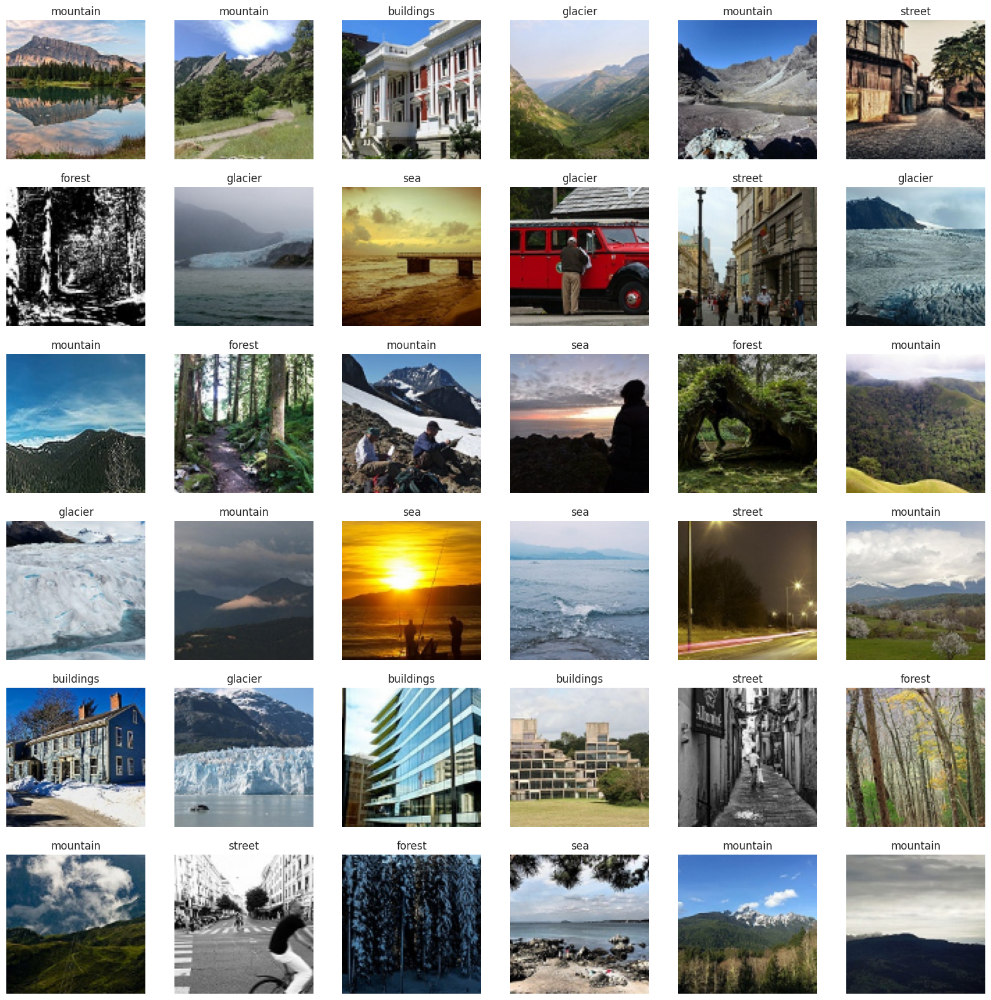

In [14]:
plt.figure(figsize=(20, 20))
for n, i in enumerate(list(np.random.randint(0, len(x_train), 36))):
    plt.subplot(6, 6, n+1)
    plt.imshow(x_train[i])
    plt.axis("off")
    plt.title(get_category_from_index(y_train[i]))

In [15]:
x_test = []
y_test = []
for folder in os.listdir(f"{test_path}/seg_test"):
    files = gb.glob(pathname=f"{test_path}/seg_test/{folder}/*.jpg")
    for file in files:
        image = plt.imread(file)
        image_array = cv2.resize(image, (s, s))
        x_test.append(list(image_array))
        y_test.append(category_indices[folder])

In [16]:
print(f"We have {len(x_test)} items in x_test")

We have 3000 items in x_test


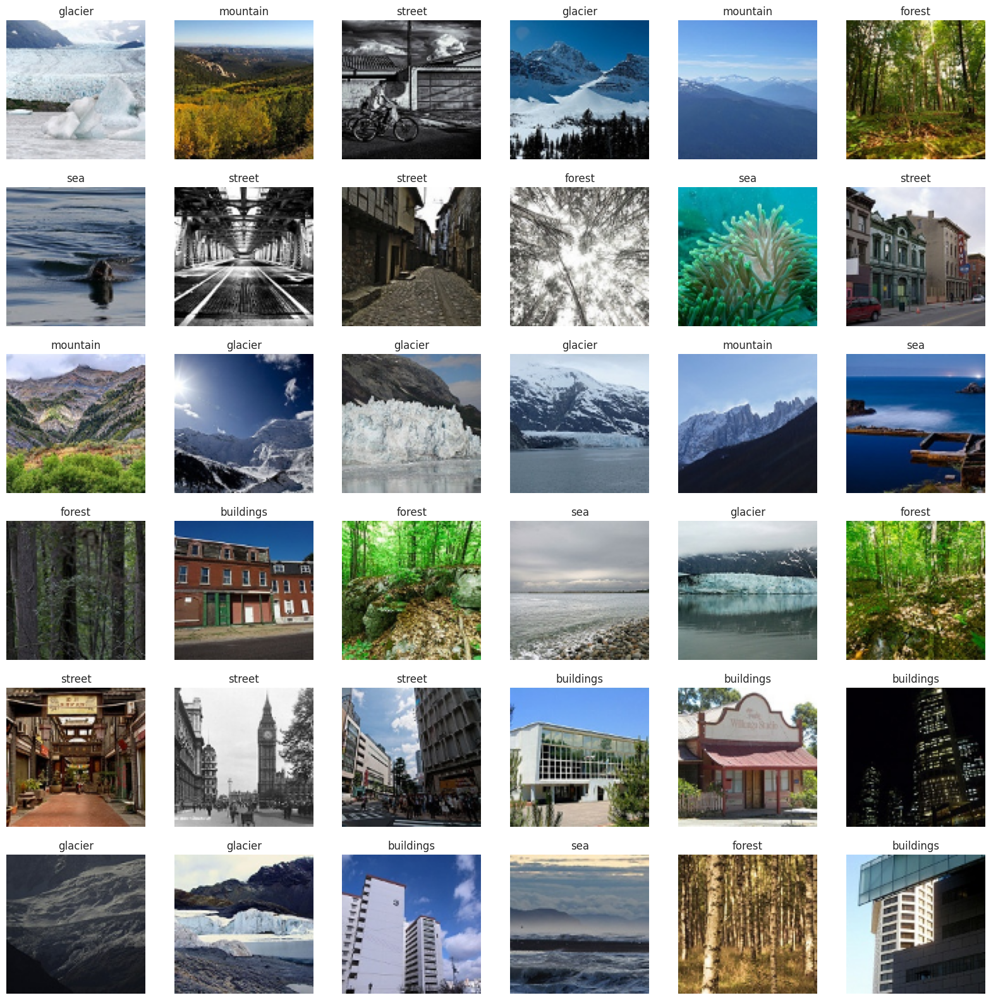

In [17]:
plt.figure(figsize = (20,20))
for n, i in enumerate(list(np.random.randint(0,len(x_test),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_test[i])
    plt.axis('off')
    plt.title(get_category_from_index(y_test[i]))

In [18]:
x_pred = []
files = gb.glob(pathname=f"{pred_path}/seg_pred/*.jpg")
for file in files:
    image = plt.imread(file)
    image_array = cv2.resize(image, (s, s))
    x_pred.append(list(image_array))

In [19]:
print(f"We have {len(x_pred)} items in x_pred")

We have 7301 items in x_pred


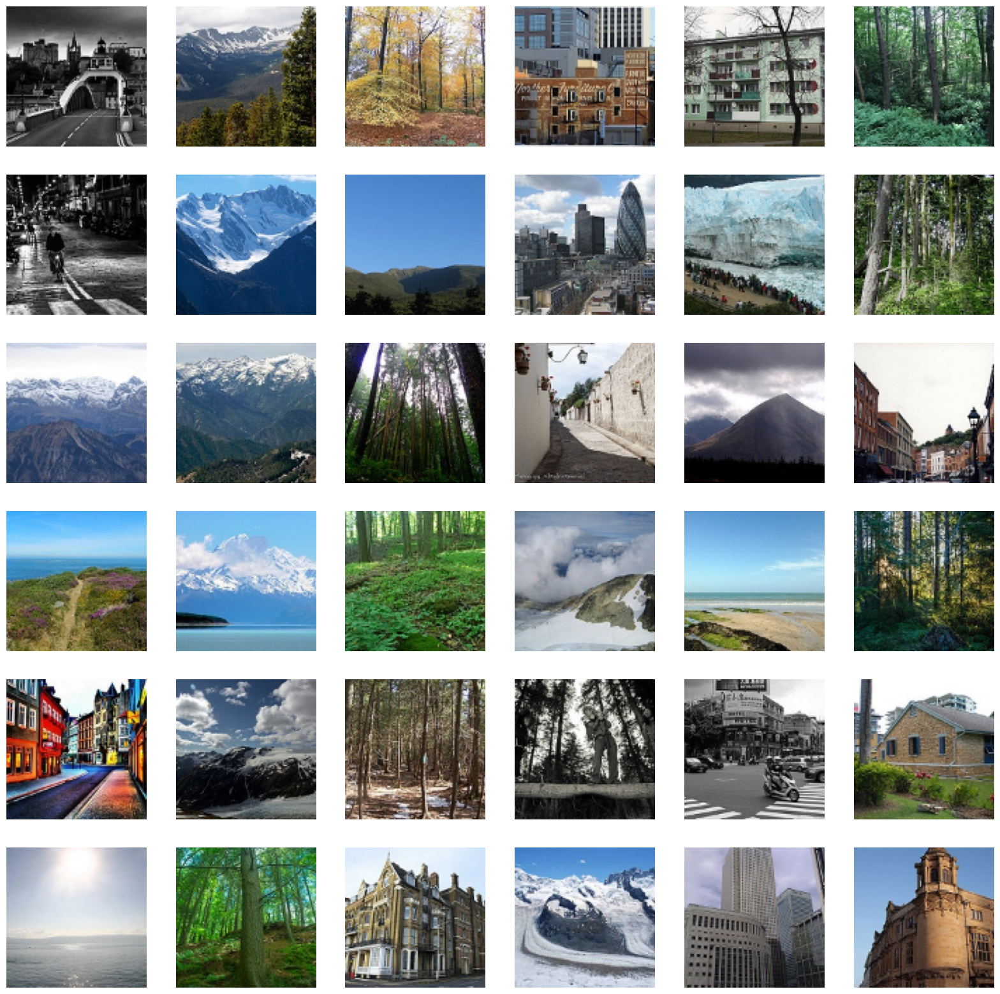

In [20]:
plt.figure(figsize = (20,20))
for n, i in enumerate(list(np.random.randint(0,len(x_pred),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])
    plt.axis('off')

In [21]:
x_train = np.array(x_train)
x_test = np.array(x_test)
x_pred_array = np.array(x_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f"x_train shape is {x_train.shape}")
print(f"y_train shape is {y_train.shape}")
print(f"x_test shape is {x_test.shape}")
print(f"y_test shape is {y_test.shape}")
print(f"x_pred shape is {x_pred_array.shape}")

x_train shape is (14034, 100, 100, 3)
y_train shape is (14034,)
x_test shape is (3000, 100, 100, 3)
y_test shape is (3000,)
x_pred shape is (7301, 100, 100, 3)
